# Appendix

This appendix contains the rest of the code we used to apply various data science techniques to our data. These are the parts that did not quite apply to our goal of predicting the energy of spotify tracks. 

In [2]:
import pandas as pd

df = pd.read_csv("hf://datasets/maharshipandya/spotify-tracks-dataset/dataset.csv")

In [3]:
df = df.dropna()
missing_prop = df.isna().sum() / len(df.index)
missing_prop.sort_values()
missing_rows = df[df.isna().any(axis=1)]

print("Number of missing data rows:", len(missing_rows))
print("Missing data rows:")
print(missing_rows)

Number of missing data rows: 0
Missing data rows:
Empty DataFrame
Columns: [Unnamed: 0, track_id, artists, album_name, track_name, popularity, duration_ms, explicit, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo, time_signature, track_genre]
Index: []

[0 rows x 21 columns]


### **Exploratory Data Analysis:**

Average popularity per Genre

In [4]:
avg_popularity_per_genre = df.groupby('track_genre')['popularity'].mean().reset_index()
avg_popularity_per_genre.columns = ["Genre", "Avg Popularity"]
avg_popularity_per_genre = avg_popularity_per_genre.sort_values(by='Avg Popularity', ascending=False)

avg_popularity_per_genre

,Genre,Avg Popularity
81,pop-film,59.283000
65,k-pop,56.952953
15,chill,53.651000
94,sad,52.379000
44,grunge,49.594000
...,...,...
13,chicago-house,12.339000
24,detroit-techno,11.174000
67,latin,8.297000
93,romance,3.245000


Average Danceability Per Genre Table:

In [5]:
avg_dance_per_genre = df.groupby('track_genre')['danceability'].mean().reset_index()
avg_dance_per_genre.columns = ["Genre", "Avg Danceability"]
avg_dance_per_genre_sorted = avg_dance_per_genre.sort_values(by='Avg Danceability', ascending=True)
pd.set_option('display.max_rows', None)
print(avg_dance_per_genre_sorted)


                 Genre  Avg Danceability
101              sleep          0.167923
42           grindcore          0.271854
6          black-metal          0.296411
59             iranian          0.300686
76               opera          0.313563
75             new-age          0.348455
4              ambient          0.367867
22         death-metal          0.368411
16           classical          0.381923
113        world-music          0.414572
72           metalcore          0.423800
50         heavy-metal          0.428500
93             romance          0.432133
79               piano          0.455098
44              grunge          0.457062
26              disney          0.462874
98          show-tunes          0.463738
71               metal          0.464288
40              gospel          0.473298
82           power-pop          0.473410
41                goth          0.478875
47           hard-rock          0.482250
38              garage          0.484264
85              

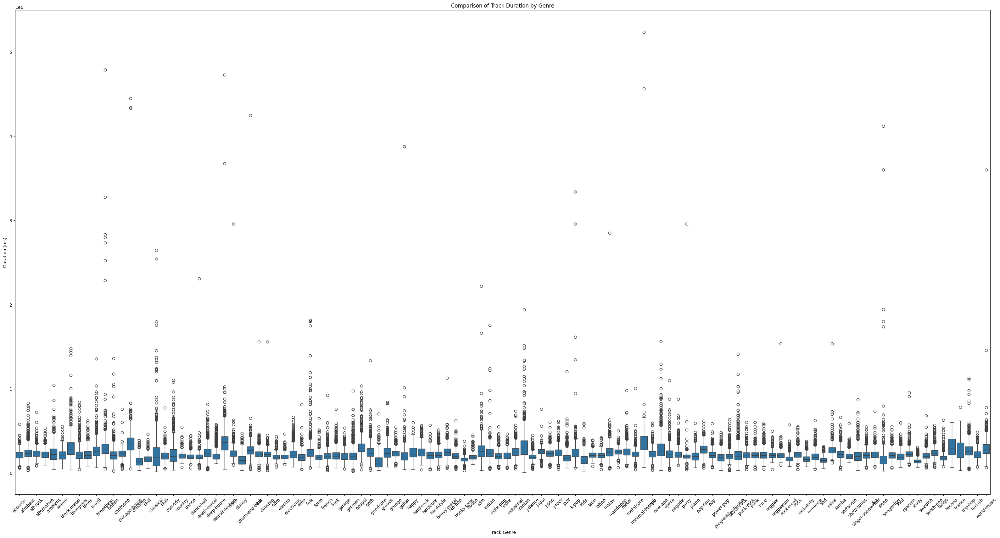

In [ ]:
%matplotlib inline
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the plot size
plt.figure(figsize=(40, 20))

# Create a box plot
sns.boxplot(x='track_genre', y='duration_ms', data = df)

# Set labels and title
plt.title('Comparison of Track Duration by Genre')
plt.xlabel('Track Genre')
plt.ylabel('Duration (ms)')

# Rotate x labels for better readability if there are many genres
plt.xticks(rotation=45)

# Show the plot
plt.show()

Week 3:

In [7]:
from sklearn.model_selection import train_test_split

# note train_test_split shuffles the data set by default

# first split the dataset into 70% training and 30% temp
train_data, temp_data = train_test_split(df, test_size=0.3, random_state=42)

# then split the temp dataset into 15% testing and 15% validation
test_data, val_data = train_test_split(temp_data, test_size=0.5, random_state=42)

print(f'Training data shape: {train_data.shape}')
print(f'Testing data shape: {test_data.shape}')
print(f'Validation data shape: {val_data.shape}')

# If need to remake these datasets, uncomment to create new CSV files
# train_data.to_csv('csv/train_data.csv', index=False)
# test_data.to_csv('csv/test_data.csv', index=False)
# val_data.to_csv('csv/val_data.csv', index=False)

Training data shape: (79799, 21)
Testing data shape: (17100, 21)
Validation data shape: (17100, 21)


In [8]:
# for consistency, everyone should use the same datasets by reading the same csv files

train_data = pd.read_csv("./csv/train_data.csv")
test_data = pd.read_csv("./csv/test_data.csv")
val_data = pd.read_csv("./csv/val_data.csv")

In [9]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_scaled = []
y = []

for d in [train_data, test_data, val_data]:
    non_numeric_cols = d.select_dtypes(include=['object']).columns
    # print(non_numeric_cols)

    X = d.drop(columns=['popularity', 'track_id', 'track_name','album_name', 'artists', 'track_genre'])
    y.append(d['popularity'])

    # for lasso:
    scaler = StandardScaler()
    X_scaled.append(scaler.fit_transform(X))

In [10]:
# training data
X_train = X_scaled[0]
y_train = y[0]

# testing data
X_test = X_scaled[1]
y_test = y[1]

# validation data
X_val = X_scaled[2]
y_val = y[2]

### Regularization
We are using lasso regression (L1 Regularization)

In [11]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

lasso = Lasso(alpha=0.1) # try changing alpha to make it better!
lasso.fit(X_train, y_train)

y_val_pred = lasso.predict(X_val)
#MSE
val_mse = mean_squared_error(y_val, y_val_pred)
print(f"Validation MSE: {val_mse}")

lasso_coefficients = lasso.coef_
feature_names = X.columns
# feature_names = df.drop(columns=['popularity', 'track_id', 'track_name','album_name', 'artists', 'track_genre']).columns
important_features = [(feature, coef) for feature, coef in zip(feature_names, lasso_coefficients) if coef != 0]
important_features = sorted(important_features, key=lambda x: abs(x[1]), reverse=True)

print("Important Features:")
for feature, coef in important_features:
    print(f"{feature}: {coef}")

Validation MSE: 482.86028217945733
Important Features:
instrumentalness: -2.4147028750099873
valence: -2.2671419290598616
speechiness: -1.4187471577556365
danceability: 1.2105724310109753
explicit: 0.8757417797762871
Unnamed: 0: 0.4617996878219175
time_signature: 0.40688282973599005
tempo: 0.30046698670147093
mode: -0.2540433439760859
loudness: 0.25401274774090793
energy: -0.17883783434738704
acousticness: -0.09365770338322718
duration_ms: -0.09162713619712612
liveness: 0.022333228072016903


 Based on these lasso regression results to find the most important predictors of popularity, we have decided to use Danceability as our predictors of popularity so we can apply linear regression. 
 
 One question we have: we are a bit confused about why valence is a big negative predictor of popularity. Some of the lasso regression results were did not exactly align with our own assumptions of what they should be. 

In [12]:
#Linear and LAD Regression Models
from sklego.linear_model import LADRegression
from sklearn.linear_model import LinearRegression

lad_fit = LADRegression()
lad_fit.fit(X_train, y_train)

ls_fit = LinearRegression()
ls_fit.fit(X_train,y_train)
print("Intercept: ", ls_fit.intercept_)
print("Coefficients: ", ls_fit.coef_[0])

Intercept:  33.2653007518797
Coefficients:  0.5566069704013216


In [16]:
import plotly.graph_objects as go
import plotly.express as px
from datascience import *
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt

# plot both the LS and LAD lines on top of the scatterplot of gr_liv_area against sale_price
fig = px.scatter(train_data, x='danceability', y='popularity')
fig.add_trace(
    go.Scatter(x=train_data['danceability'],
                y=lad_fit.intercept_ + train_data['danceability'] * lad_fit.coef_[0],
                mode='lines',
                name='LAD',
                line={'dash': 'dash',
                      'color': 'red'})
                # L1 model
)
fig.add_trace(
    go.Scatter(x=train_data['danceability'],
                y=ls_fit.intercept_ + train_data['danceability'] * ls_fit.coef_[0],
                mode='lines',
                name='LS',
                line={'dash': 'solid',
                      'color': 'black'})
                # L2 model
)
fig.update_traces(marker=dict(size=2))

Not great for visualization, let's try a different form of regression.

In [17]:
# Linear Model Evaluation

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Training Data
pred_train_df = pd.DataFrame( # dataframe to compare true value to predicted value
    {'true': y_train,
     'ls_pred': ls_fit.predict(np.array(X_train))})

# compute the rMSE, MAE, MAD, correlation and R2 of true value with predictions
print('LS rMSE:', np.sqrt(mean_squared_error(pred_train_df['true'], pred_train_df['ls_pred'])))
print('LS MAE:', mean_absolute_error(pred_train_df['true'], pred_train_df['ls_pred']))
print('LS MAD:', np.median(np.abs(pred_train_df['true'] - pred_train_df['ls_pred'])))
print('LS correlation:', np.corrcoef(pred_train_df['true'], pred_train_df['ls_pred'])[0, 1])
print('LS R2:', r2_score(pred_train_df['true'], pred_train_df['ls_pred']))

# Validation Data
pred_val_df = pd.DataFrame( # dataframe to compare true value to predicted value
    {'true': y_val,
     'ls_pred': ls_fit.predict(np.array(X_val))})

# compute the rMSE, MAE, MAD, correlation and R2 of true value with predictions
print('LS rMSE:', np.sqrt(mean_squared_error(pred_val_df['true'], pred_val_df['ls_pred'])))
print('LS MAE:', mean_absolute_error(pred_val_df['true'], pred_val_df['ls_pred']))
print('LS MAD:', np.median(np.abs(pred_val_df['true'] - pred_val_df['ls_pred'])))
print('LS correlation:', np.corrcoef(pred_val_df['true'], pred_val_df['ls_pred'])[0, 1])
print('LS R2:', r2_score(pred_val_df['true'], pred_val_df['ls_pred']))

LS rMSE: 22.0393643843
LS MAE: 18.378427291
LS MAD: 15.9652304617
LS correlation: 0.161013356635
LS R2: 0.02592530101480972
LS rMSE: 21.9695910058
LS MAE: 18.3143020336
LS MAD: 15.8762158042
LS correlation: 0.157469512411
LS R2: 0.02470036472170356


#### Applying Ridge Regression

In [21]:
# for ridge regression
X = df.drop(columns=['popularity', 'track_id', 'track_name','album_name', 'artists', 'track_genre'])
y = df['popularity']

In [22]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold, cross_validate, learning_curve


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print(f"X_scaled shape: {X_scaled.shape}")

alphas = np.logspace(-1, 6, 100)
kf = KFold(n_splits=10, shuffle=True, random_state=42)


ridge_cv_scores = []
for alpha in alphas:
  ridge = Ridge(alpha=alpha)
  ridge_cv = cross_validate(estimator=ridge,
                              X=X_scaled,
                              y=y,
                              cv=kf,
                              scoring='neg_root_mean_squared_error')
  ridge_cv_scores.append({'alpha': alpha,
                            'log_alpha': np.log(alpha),
                            'test_mse': -np.mean(ridge_cv['test_score'])})

ridge_cv_scores_df = pd.DataFrame(ridge_cv_scores)
px.line(ridge_cv_scores_df,
        x='log_alpha',
        y='test_mse',
        title='Ridge')  

#find best alpha
ridge_alpha_min = ridge_cv_scores_df.sort_values(by='test_mse').head(1).alpha.values[0]

mse_se_ridge = ridge_cv_scores_df['test_mse'].std() / np.sqrt(10)
mse_min_ridge = ridge_cv_scores_df['test_mse'].min()

ridge_alpha_1se = ridge_cv_scores_df[(ridge_cv_scores_df['test_mse'] <= mse_min_ridge + mse_se_ridge) &
                                     (ridge_cv_scores_df['test_mse'] >= mse_min_ridge - mse_se_ridge)].sort_values(by='alpha', ascending=False).head(1).alpha.values[0]

print('Ridge (min): ', ridge_alpha_min)
print('Ridge (1SE): ', ridge_alpha_1se)

ridge_min_fit = Ridge(alpha=ridge_alpha_min).fit(X=X_scaled, y=y)
ridge_1se_fit = Ridge(alpha=ridge_alpha_1se).fit(X=X_scaled, y=y)

X_scaled shape: (113999, 15)
Ridge (min):  403.70172586
Ridge (1SE):  23644.8941265


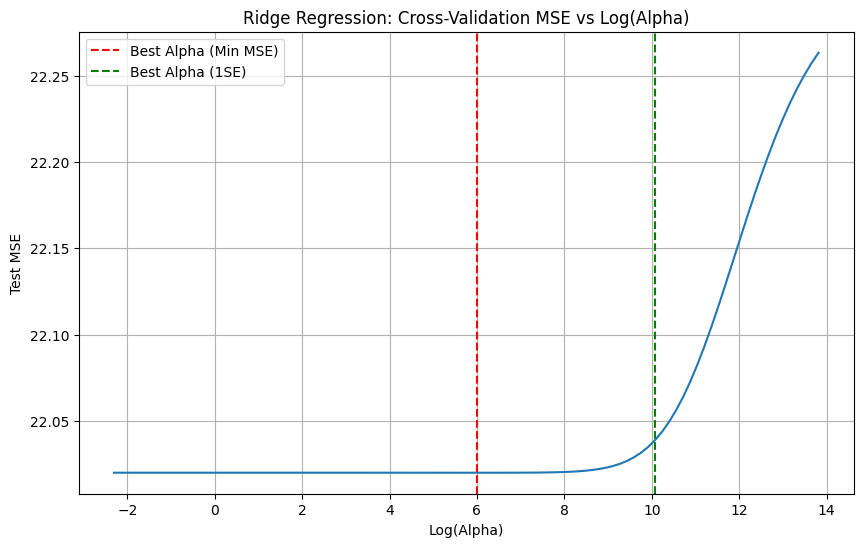

In [25]:
%matplotlib inline
plt.figure(figsize=(10, 6))
plt.plot(ridge_cv_scores_df['log_alpha'], ridge_cv_scores_df['test_mse'])
plt.title('Ridge Regression: Cross-Validation MSE vs Log(Alpha)')
plt.xlabel('Log(Alpha)')
plt.ylabel('Test MSE')
plt.axvline(x=np.log(ridge_alpha_min), color='r', linestyle='--', label='Best Alpha (Min MSE)')
plt.axvline(x=np.log(ridge_alpha_1se), color='g', linestyle='--', label='Best Alpha (1SE)')
plt.legend()
plt.grid()
# plt.show()

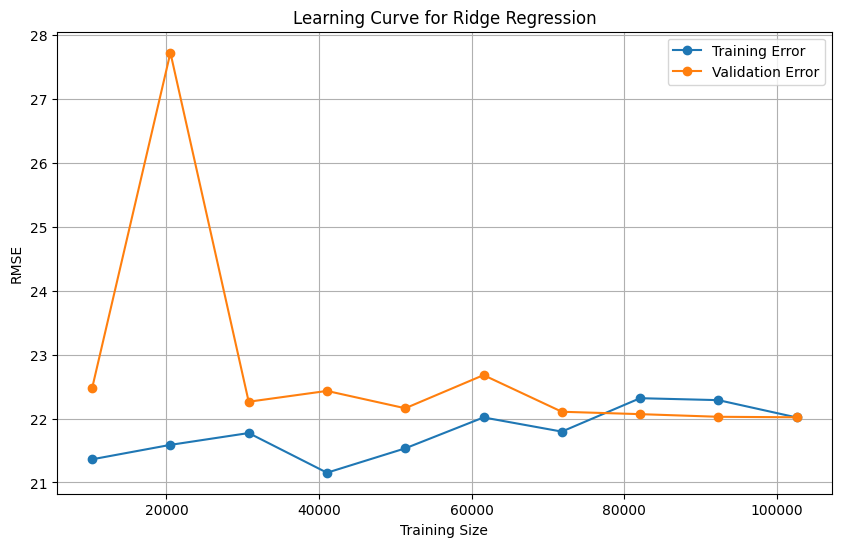

In [26]:
train_sizes, train_scores, test_scores = learning_curve(
    Ridge(alpha=ridge_alpha_min), X_scaled, y, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), cv=kf, scoring='neg_root_mean_squared_error'
)
train_scores_mean = -np.mean(train_scores, axis=1)  # Negate to convert from negative RMSE to positive
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = -np.mean(test_scores, axis=1)    # Negate to convert from negative RMSE to positive
test_scores_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training Error', marker='o')
plt.plot(train_sizes, test_scores_mean, label='Validation Error', marker='o')
plt.title('Learning Curve for Ridge Regression')
plt.xlabel('Training Size')
plt.ylabel('RMSE')
plt.legend()
plt.grid()
plt.show()

# Overfitting or Underfitting?
This graph shows that from 20000 to about 30000 (training size), the training error and validation error gap being really big means the model is overfitting, meaning the model isn't good at generalizing at this smaller size. Then the error gap decreases after 40000 and continues to improve.

### Week 4: Logistic Regression

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_curve

In [28]:
response = df['mode']

In [29]:
X = df[['acousticness', 'energy', 'key']]
y = df['mode']

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)

In [31]:
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [32]:
# prediction accuracy and error
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Prediction Accuracy: {accuracy * 100:.2f}%")
print(f"Prediction Error: {(1-accuracy) * 100:.2f}%")

Prediction Accuracy: 64.77%
Prediction Error: 35.23%


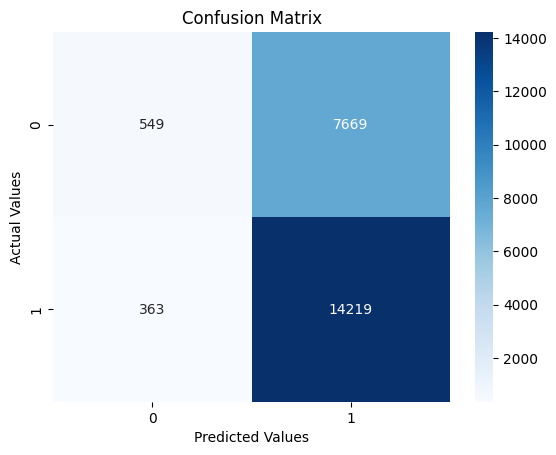

In [33]:
# confusion matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.show()

In [34]:
# True posiive and negative rate
truePositiveRate = cm[1,1] / (cm[1,1] + cm[1,0])
falsePositiveRate = cm[0,1] / (cm[0,1] + cm[0,0])
print(f"True Positive Rate: {truePositiveRate:.2f}")
print(f"True Negative Rate: {falsePositiveRate:.2f}")

True Positive Rate: 0.98
True Negative Rate: 0.93


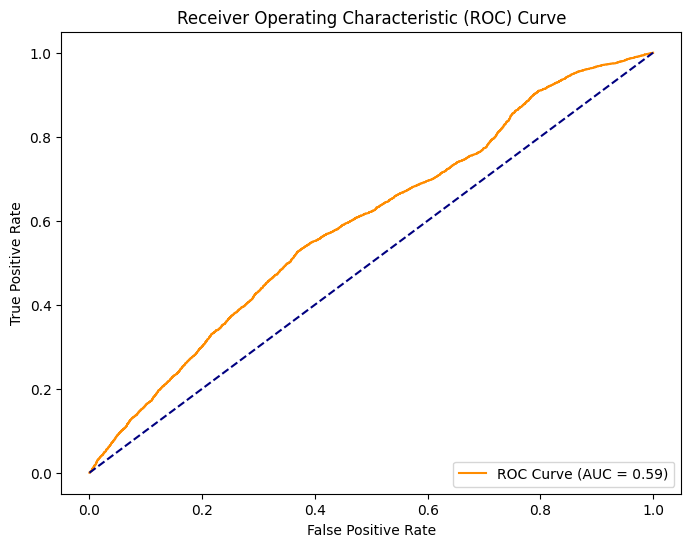

optimal_threshold:  0.649974884131


In [35]:
# ROC Curve
y_prob = model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = roc_auc_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})', color='darkorange')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print('optimal_threshold: ', optimal_threshold)